<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from debugpy.adapter.components import missing
from seaborn import heatmap
import pickle
from IPython.display import display

random.seed(42)
np.random.seed(42)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Сиды в домашках фиксируются для того, чтобы совпали результаты с тем, кто проверяет ДЗ.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [61]:
import pandas as pd

In [62]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [63]:
#Отображение 30 случайных строк тренировочного датасета.
print(f'Отображение 30 случайных строк тренировочного датасета')
df_train_randon = df_train.sample(n = 30, random_state = 42)
print(df_train_randon)
#Отображение первых 5 и последних 5 объектов тестового теста
print(f'\nОтображение первых 5 и последних 5 объектов тестового теста')
print(df_test.head(5))
print(df_test.tail(5))
#Анализ наличия пропусков.
print(f'\nАнализ наличия пропусков тренировочного датасета:')
missing_data = df_train.isnull().sum()
print(missing_data[missing_data > 0])
print(f'\nАнализ наличия пропусков тестового датасета:')
missing_data = df_test.isnull().sum()
print(missing_data[missing_data > 0])
#Поиск дубликатов.
print(f'\nКоличество дубликатов тренировочного датасета:')
print(df_train.duplicated().sum())
print(f'\nКоличество дубликатов тестового датасета:')
print(df_test.duplicated().sum())

Отображение 30 случайных строк тренировочного датасета
                                        name  year  selling_price  km_driven  \
6565        Renault KWID Climber 1.0 MT BSIV  2019         300000      35000   
2943                      Maruti Wagon R LXI  2013         225000      58343   
2024                    Hyundai i20 Asta 1.2  2013         360000      30000   
263                     Hyundai i20 1.2 Asta  2010         300000      70000   
4586        Skoda Octavia L and K 1.9 TDI MT  2005         250000     120000   
4479                         Maruti Ciaz ZXi  2016         700000      20000   
4881  Hyundai Grand i10 1.2 Kappa Magna BSIV  2017         445000      27000   
3583          Ford Ecosport 1.5 DV5 MT Trend  2016         515000      68609   
6361                  Hyundai Verna 1.4 VTVT  2014         500000      33400   
4108                     Hyundai i20 Era 1.2  2015         490000      45900   
132          Mercedes-Benz S-Class S 350 CDI  2017        5850000

Используя случайные/верхние/нижние строки можно сделать следующие выводы:
- в датасете присутсвует разнообразие автомобильных марок, от корейских авто, до европейских.
- большой разброс в пробеге автомобилей и в их ценообразовании.
- большое количество автомобилей Hyundai.

Отсутсвует возможность сделать выводы о:
- более точных параметров всех автомобилей, таких как, средняя стоимость и средний пробег из-за большой разницы цен и пробега соответственно.
- отсутствие значимых критериев.
- более точной средней стоимости конкретной модели автомобиля из-за наличия различных модификаций, присутствующих в автомобиле.

Достаточно ли метода duplicated для анализа дубликатов? Почему?
- Нет, данного метода не достаточно по причине наличия одинаковых автомобилей с названиями, содержащие разное оформление (Например, Hyundai i20 Astra 1.2 и Hyundai i20 1.2 Astra). Метод duplicated() находит только полные копии строк.

In [64]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
car = ProfileReport(df_train, title="Дашбоард")
#car.to_file("your_report.html")

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [65]:
df_train_filled = df_train.copy()
df_train_filled = df_train_filled.fillna(df_train_filled.median(numeric_only=True))
df_train_filled = df_train_filled.sample(n = 70, random_state = 42)
print(df_train_filled)

                                                   name  year  selling_price  \
6565                   Renault KWID Climber 1.0 MT BSIV  2019         300000   
2943                                 Maruti Wagon R LXI  2013         225000   
2024                               Hyundai i20 Asta 1.2  2013         360000   
263                                Hyundai i20 1.2 Asta  2010         300000   
4586                   Skoda Octavia L and K 1.9 TDI MT  2005         250000   
4479                                    Maruti Ciaz ZXi  2016         700000   
4881             Hyundai Grand i10 1.2 Kappa Magna BSIV  2017         445000   
3583                     Ford Ecosport 1.5 DV5 MT Trend  2016         515000   
6361                             Hyundai Verna 1.4 VTVT  2014         500000   
4108                                Hyundai i20 Era 1.2  2015         490000   
132                     Mercedes-Benz S-Class S 350 CDI  2017        5850000   
6974             Fiat Grande Punto 1.3 D

### **Задание 2 (0.5 балла)**

На прошлом шаге вы рассмотрели дубликаты. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [66]:
key_columns = ['name', 'year', 'km_driven', 'fuel', 'seller_type','transmission','owner','mileage','engine','max_power']
df_train_duplicated = df_train[df_train.duplicated(subset=key_columns, keep=False)]
#Отображение количества дубликатов
print(f'Если под "целевую переменную следует исключить" понимается поиск дубликатов без учета стоимости, тогда дубликатов:{df_train_duplicated.shape[0]}')
duplicates_sorted = df_train_duplicated.sort_values(by=df_train_duplicated.columns.tolist())


#Отображение всех сортированных дубликатов без учета стоимости
print('Дубликаты:')
display(duplicates_sorted)

#Удаление повторяющихся строк
df_train = df_train.drop_duplicates(subset=key_columns, keep='first')
df_test = df_test.drop_duplicates(subset=key_columns, keep='first')
#Переназначение индексов
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)
print('Строки без дубликатов:')
display(df_train)
#display(df_no_duplicates)

#Была найдена строка только с единицей измерения, без числа. Меняем значение на NaN, в дальнейшем поменяем на медианное значение
df_train.loc[3586, 'max_power'] = np.nan




Если под "целевую переменную следует исключить" понимается поиск дубликатов без учета стоимости, тогда дубликатов:1799
Дубликаты:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
1337,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
1595,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
2787,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
4485,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
6640,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0


Строки без дубликатов:


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.3 km/kg,1061 CC,57.5 bhp,"7.8@ 4,500(kgm@ rpm)",5.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm,4.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59 kmpl,1364 CC,67.1 bhp,170Nm@ 1800-2400rpm,5.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.0 kmpl,1399 CC,68.1 bhp,160Nm@ 2000rpm,5.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01 kmpl,1461 CC,108.45 bhp,248Nm@ 2250rpm,5.0


In [67]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [68]:
#удаление столбца torque
del df_train['torque']
del df_test['torque']

#Удаление единиц измерения и приведение к float.
df_train['mileage'] = df_train['mileage'].str.split().str[0].astype(float)
df_train['engine'] = df_train['engine'].str.split().str[0].astype(float)
df_train['max_power'] = df_train['max_power'].str.split().str[0].astype(float)

df_test['mileage'] = df_test['mileage'].str.split().str[0].astype(float)
df_test['engine'] = df_test['engine'].str.split().str[0].astype(float)
df_test['max_power'] = df_test['max_power'].str.split().str[0].astype(float)

#Добавление медианных значений к пустым строкам
df_train = df_train.fillna(df_train.median(numeric_only=True))
df_test = df_test.fillna(df_train.median(numeric_only=True))

display(df_train)
display(df_test) 

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.000,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.520,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.000,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.200,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.860,5.0
5,Maruti Wagon R LXI DUO BSIII,2007,96000,175000,LPG,Individual,Manual,First Owner,17.30,1061.0,57.500,5.0
6,Maruti 800 DX BSII,2001,45000,5000,Petrol,Individual,Manual,Second Owner,16.10,796.0,37.000,4.0
7,Toyota Etios VXD,2011,350000,90000,Diesel,Individual,Manual,First Owner,23.59,1364.0,67.100,5.0
8,Ford Figo Diesel Celebration Edition,2013,200000,169000,Diesel,Individual,Manual,First Owner,20.00,1399.0,68.100,5.0
9,Renault Duster 110PS Diesel RxL,2014,500000,68000,Diesel,Individual,Manual,Second Owner,19.01,1461.0,108.450,5.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,5.0
5,Mahindra Thar CRDe,2019,975000,12584,Diesel,Dealer,Manual,First Owner,16.55,2498.0,105.00,6.0
6,Chevrolet Spark 1.0 LS,2011,150000,35000,Petrol,Individual,Manual,First Owner,18.00,995.0,62.00,5.0
7,Maruti Ritz ZXi,2012,275000,70000,Petrol,Individual,Manual,Second Owner,18.50,1197.0,85.80,5.0
8,Maruti Alto LX,2011,140000,72000,Petrol,Individual,Manual,Second Owner,19.70,796.0,46.30,5.0
9,Hyundai Creta 1.6 CRDi SX,2016,850000,58000,Diesel,Individual,Manual,First Owner,19.67,1582.0,126.20,5.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [69]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)

df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

df_train.info()
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           5840 non-null   object 
 1   year           5840 non-null   int64  
 2   selling_price  5840 non-null   int64  
 3   km_driven      5840 non-null   int64  
 4   fuel           5840 non-null   object 
 5   seller_type    5840 non-null   object 
 6   transmission   5840 non-null   object 
 7   owner          5840 non-null   object 
 8   mileage        5840 non-null   float64
 9   engine         5840 non-null   int64  
 10  max_power      5840 non-null   float64
 11  seats          5840 non-null   int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 547.6+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 931 entries, 0 to 930
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [70]:
print('Тренировочные данные')
display(df_train.describe())
display(df_train.describe(include=['object', 'category']))
print(f'\nТестовые данные')
display(df_test.describe())
display(df_test.describe(include=['object', 'category']))

print('\nПроанализировав таблицы можно сделать следующие выводы:\n'
    '- в датасете имеются как более "свежие" автомобили, так и очень старые (1983 года)\n'
    '- очень большой разброс цен\n'
    '- вероятно имеется выброс в пробеге (2.360457e+06)\n'
    '- в max_power самое минимальное значение - 0, что является ошибкой, т.к. нулевой мощности не существует\n'   
)

Тренировочные данные


,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603



Тестовые данные


,year,selling_price,km_driven,mileage,engine,max_power,seats
count,931.000000,9.310000e+02,931.000000,931.000000,931.000000,931.000000,931.000000
mean,2013.506982,5.501182e+05,72786.747583,19.379280,1435.484425,88.561837,5.409237
std,4.043408,5.987156e+05,48823.924040,3.994487,515.908793,32.715854,0.924622
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,4.000000
25%,2011.000000,2.500000e+05,39000.000000,16.500000,1196.500000,68.050000,5.000000
50%,2014.000000,4.200000e+05,65000.000000,19.370000,1248.000000,81.860000,5.000000
75%,2017.000000,6.500000e+05,100000.000000,22.320000,1498.000000,100.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.000000,280.000000,9.000000


,name,fuel,seller_type,transmission,owner
count,931,931,931,931,931
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,14,498,813,839,562



Проанализировав таблицы можно сделать следующие выводы:
- в датасете имеются как более "свежие" автомобили, так и очень старые (1983 года)
- очень большой разброс цен
- вероятно имеется выброс в пробеге (2.360457e+06)
- в max_power самое минимальное значение - 0, что является ошибкой, т.к. нулевой мощности не существует



In [38]:
assert df_train.shape == (5840, 13)
#Если это проверка на целостность таблицы, то почему столбцов 13, если мы удалили один столбец выше?

AssertionError: 

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

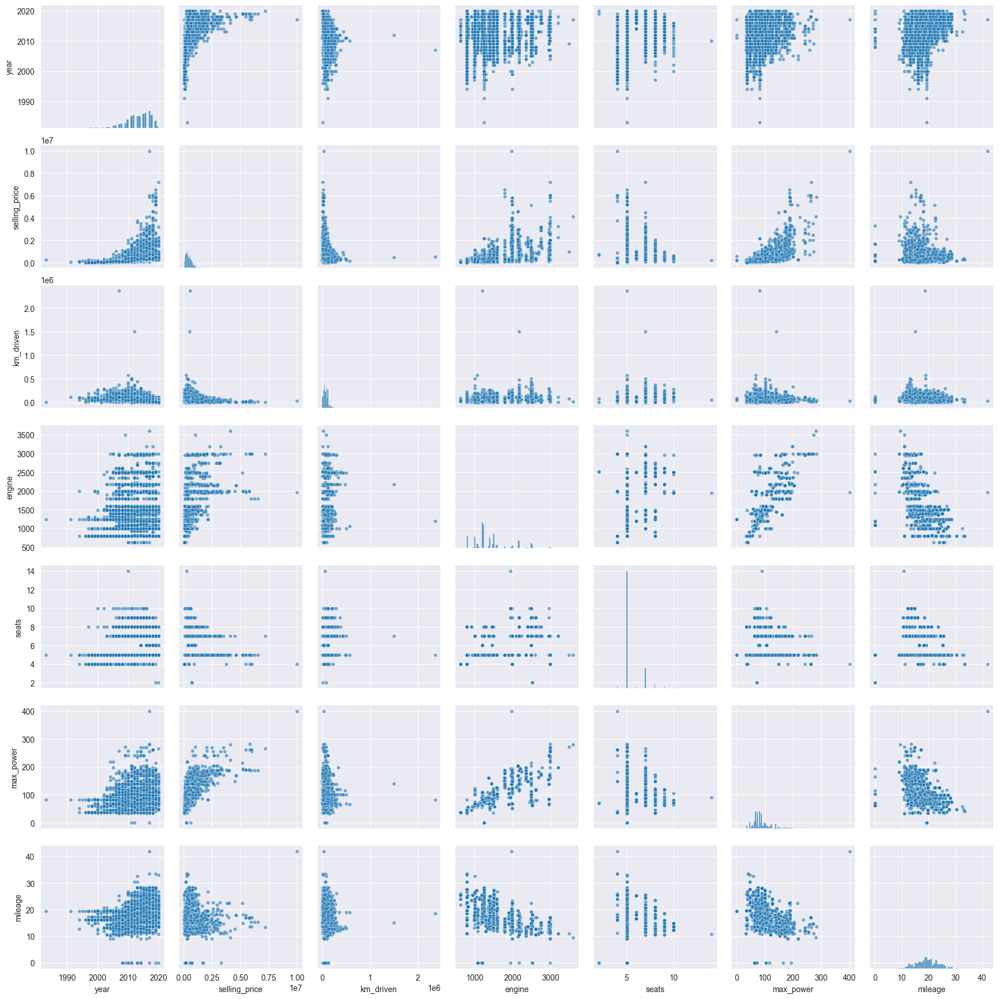

In [71]:
numeric_cols = ['year', 'selling_price', 'km_driven', 'engine', 'seats', 'max_power', 'mileage']

pairplot = sns.pairplot(df_train[numeric_cols], 
                        diag_kind='hist', 
                        plot_kws={'alpha': 0.6, 's': 20},
                        )

plt.tight_layout()
plt.show()

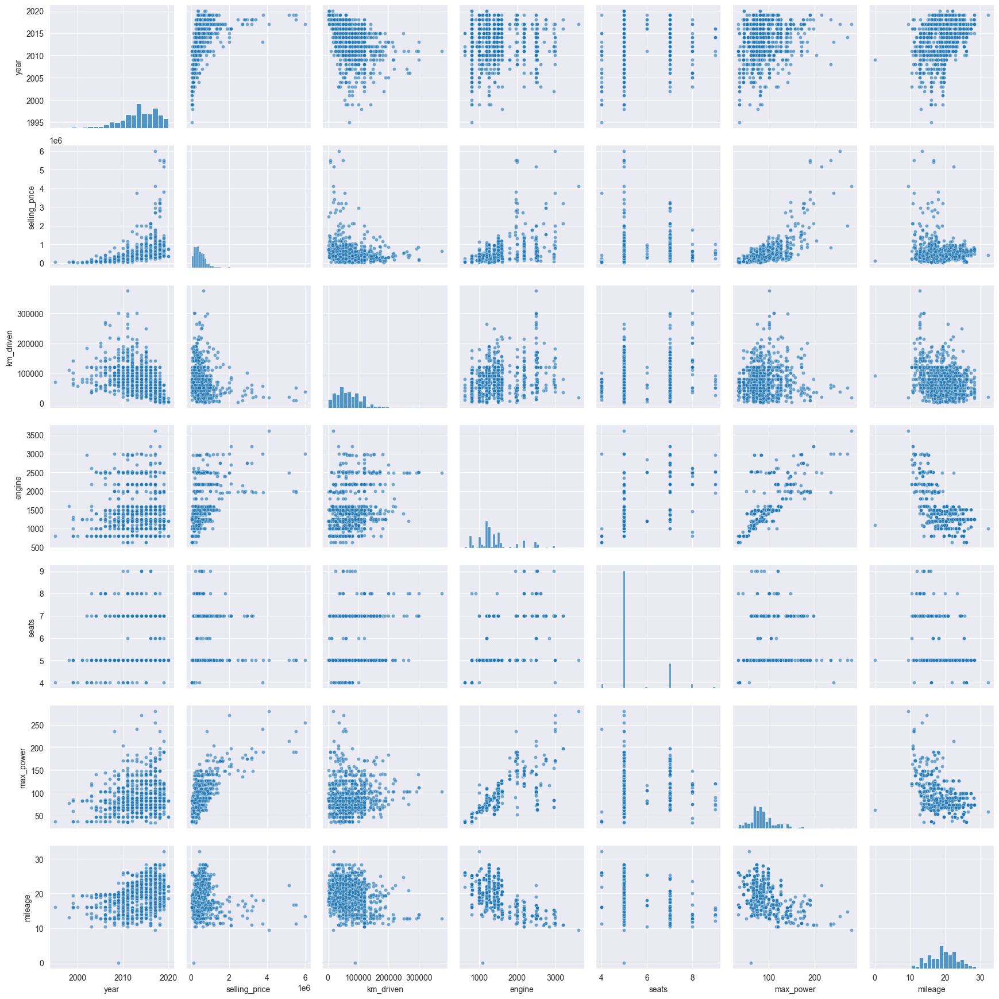

In [72]:
pairplot = sns.pairplot(df_test[numeric_cols], 
                        diag_kind='hist', 
                        plot_kws={'alpha': 0.6, 's': 20},
                        )

plt.tight_layout()
plt.show()

По графикам можно сделать следующие выводы:
- с годами увеличивается практически большинство параметров, таких как, стоимость, мощность, объем двигателя, расход топлива, количество мест в автомобиле.
- высокая стоимость автомобиля обуславливается низким расходом топлива, высокими мощностью автомобиля, объемом двигателя и пробегом автомобиля.
- на графиках видно как положительную корреляцию (стоимость - мощность, стоимость - объем двигателя), так и отрицательную (стоимость - пробег). Возможно, имеется нелинейная зависимость (стоимость - расход топлива)

Совокупности при разделении train и test являются похожими, имеются незначительные изменения в данных, что является нормой. Явные выборсы отсутствуют.

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


                   year  selling_price  km_driven   mileage    engine  \
year           1.000000       0.427279  -0.368966  0.341334  0.002819   
selling_price  0.427279       1.000000  -0.164828 -0.104769  0.447672   
km_driven     -0.368966      -0.164828   1.000000 -0.182086  0.229766   
mileage        0.341334      -0.104769  -0.182086  1.000000 -0.572893   
engine         0.002819       0.447672   0.229766 -0.572893  1.000000   
max_power      0.156858       0.692814   0.024588 -0.373390  0.681117   
seats          0.041178       0.149953   0.192328 -0.451059  0.652172   

               max_power     seats  
year            0.156858  0.041178  
selling_price   0.692814  0.149953  
km_driven       0.024588  0.192328  
mileage        -0.373390 -0.451059  
engine          0.681117  0.652172  
max_power       1.000000  0.244112  
seats           0.244112  1.000000  


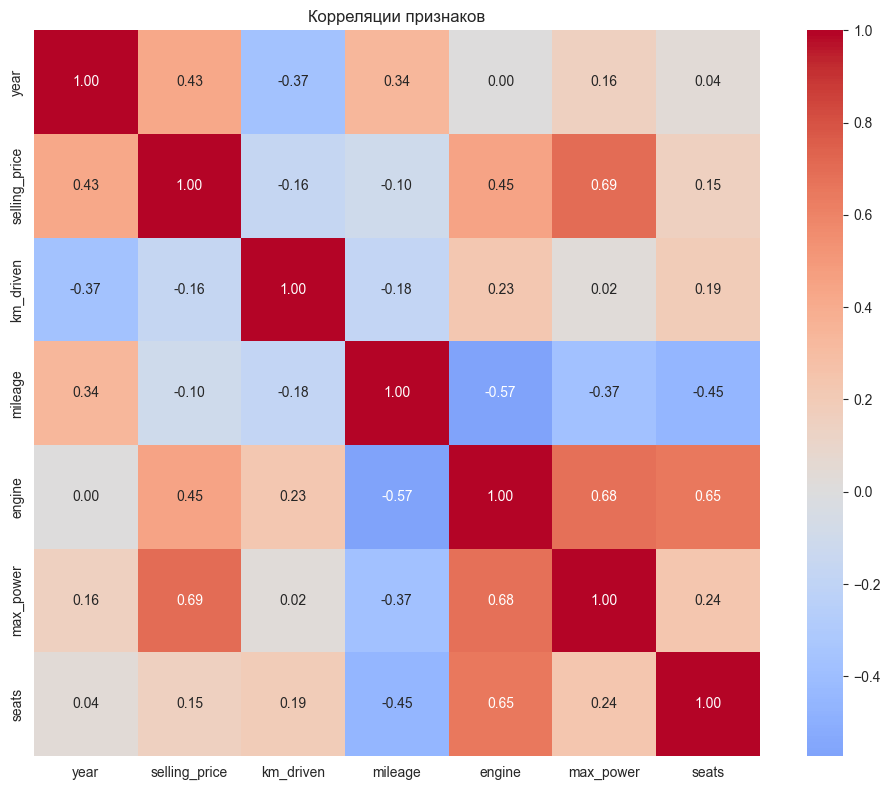

In [73]:
corr_matrix = df_train.corr(numeric_only=True)
print(corr_matrix)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, 
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            square=True)

plt.title('Корреляции признаков')
plt.tight_layout()
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

- два признака, наименее скоррелированных между собой: мощность - год, год - объем двигателя.
- сильная положительная зависимость наблюдается между отношениями стоимость - мощность, расход топлива - объем двигателя, стоимость - тип двигателя, год - стоимость, расход топлива - количество мест.
- утверждать, что, чем меньше год, тем больше пробег - некорректно, что подтверждается слабой связью по шкале Пирсона (-0,3689), а также это отображено на графике. Автомобиль может использоваться в такси, и его пробег за год достигнет значения выше, чем у дедушки, использовавший свою любимую Ласточку только по выходным на дачу за 10 лет. 

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

Зависимость цены от возраста автомобиля

С помощью данного графика можем увидеть стоимость автомобилей в зависимости от их возраста. На данном графике явно видно спад стоиомсти с увеличением возраста автомобиля. Проведя дополнительные вычисления можно будет выявить самый "выгодный" возраст продажи автомобиля для собственника.

Зависимость цен по году продажи

Для отображения зависимости стоимости от года продажи. С помощью этого графика можем узнать насколько сильно менялся рынок за имеющийся период времени. При наличии данных о месяце продаже можно увидеть сезонность рынка, но самую важную информацию, которую может нести этот график - наличие инфляции и кризисов на рынке, а также платежеспособность покупателей.


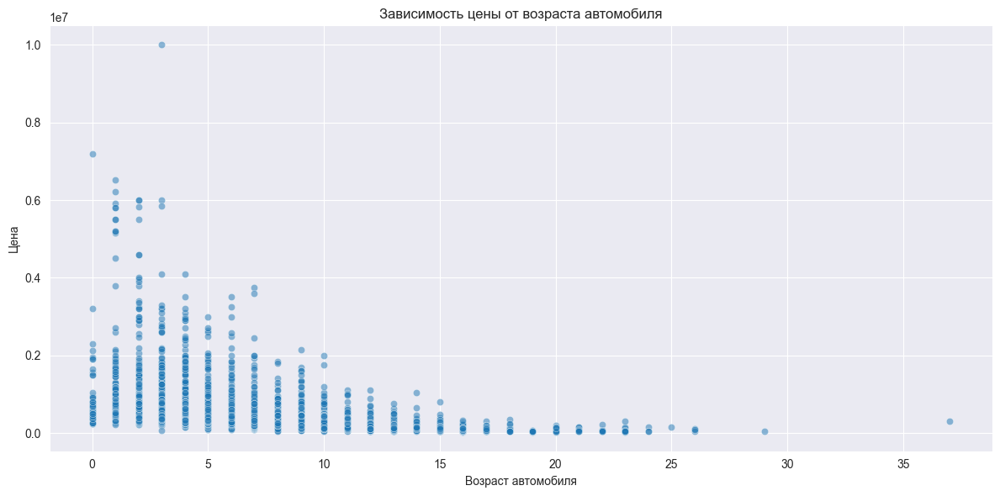

In [74]:
df_train_age = df_train.copy()
df_train_age['age'] = 2020 - df_train_age['year']
plt.subplots(figsize=(12, 6))
sns.scatterplot(x='age', y='selling_price', data=df_train_age, alpha=0.5)
plt.title('Зависимость цены от возраста автомобиля')
plt.xlabel('Возраст автомобиля')
plt.ylabel('Цена')
plt.tight_layout()
plt.show()

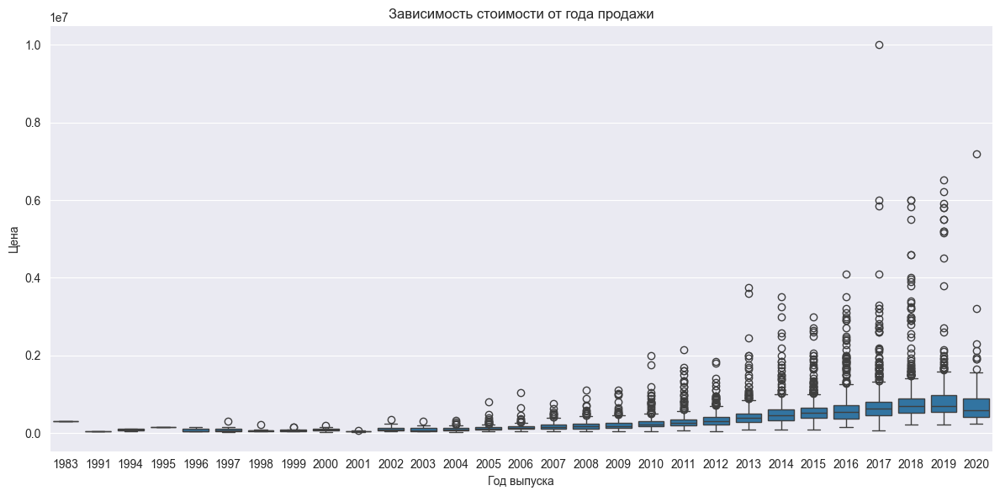

In [75]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_train, x='year', y='selling_price')
plt.title('Зависимость стоимости от года продажи')
plt.xlabel('Год выпуска')
plt.ylabel('Цена')
plt.tight_layout()
plt.show()

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test при разбиении. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [76]:
unnumeric_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner']
df_train_copy = df_train.drop(unnumeric_cols, axis=1, errors='ignore')
y_train = df_train_copy['selling_price']
X_train = df_train_copy.drop('selling_price', axis=1, errors='ignore')

display(X_train)


,year,km_driven,mileage,engine,max_power,seats
0,2014,145500,23.40,1248,74.000,5
1,2014,120000,21.14,1498,103.520,5
2,2010,127000,23.00,1396,90.000,5
3,2007,120000,16.10,1298,88.200,5
4,2017,45000,20.14,1197,81.860,5
5,2007,175000,17.30,1061,57.500,5
6,2001,5000,16.10,796,37.000,4
7,2011,90000,23.59,1364,67.100,5
8,2013,169000,20.00,1399,68.100,5
9,2014,68000,19.01,1461,108.450,5


In [77]:
# опишите выбранные вещественные признаки
# year - год продажи автомобиля (дискретная величина)
# km_driven - пробег автомобиля (непрерывная величина)
# mileage - расход двигателя (физическая величина)
# engine - объем двигателя (физическая величина)
# max_power - максимальная мощность двигателя (физическая величина)
# seats - количество посадочных мест (дискретная величина)
# selling_price - (непрерывная величина)

In [78]:
#unnumeric_cols = ['name', 'fuel', 'seller_type', 'transmission', 'owner']
df_test_copy = df_test.drop(unnumeric_cols, axis=1, errors='ignore')
y_test = df_test_copy['selling_price']
X_test = df_test_copy.drop('selling_price', axis=1, errors='ignore')

display(X_test)

,year,km_driven,mileage,engine,max_power,seats
0,2010,168000,14.00,2498,112.00,7
1,2017,25000,21.50,1497,108.50,5
2,2007,218463,12.90,1799,130.00,5
3,2015,173000,25.10,1498,98.60,5
4,2011,70000,16.50,1172,65.00,5
5,2019,12584,16.55,2498,105.00,6
6,2011,35000,18.00,995,62.00,5
7,2012,70000,18.50,1197,85.80,5
8,2011,72000,19.70,796,46.30,5
9,2016,58000,19.67,1582,126.20,5


### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model = LinearRegression()
model.fit(X_train, y_train)

y_train_predict = model.predict(X_train)
y_test_predict = model.predict(X_test)

mse_train = MSE(y_train, y_train_predict)
mse_test = MSE(y_test, y_test_predict)

r2_train = r2_score(y_train, y_train_predict)
r2_test = r2_score(y_test, y_test_predict)

print(f'MSE тренировочных данных: {mse_train}')
print(f'MSE тестовых данных: {mse_test}')
print(f'R2 тренировочных данных: {r2_train}')
print(f'R2 тестовых данных: {r2_test}')

print('\nПо полученным данным можно сказать, что модель не переобучена и подтверждает около 60% данных.')

MSE тренировочных данных: 116874153930.02876
MSE тестовых данных: 137677264480.91956
R2 тренировочных данных: 0.5922591702157309
R2 тестовых данных: 0.6155076092301432

По полученным данным можно сказать, что модель не переобучена и подтверждает около 60% данных.


### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [80]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)  

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [81]:
model_scaled = LinearRegression()
model_scaled.fit(X_train_scaled, y_train)
big_feature = pd.DataFrame({
    "Признак": list(X_train.columns),
    "Коэффициент": np.abs(model_scaled.coef_)
})
big_feature = big_feature.sort_values('Коэффициент', ascending=False)
print(big_feature)

print(f"\nНаиболее информативным признаком оказался:\n {big_feature.head(1)}")

     Признак    Коэффициент
4  max_power  322807.353259
0       year  152772.570846
3     engine   61178.494337
1  km_driven   44158.818520
2    mileage   28833.925778
5      seats   23209.132486

Наиболее информативным признаком оказался:
      Признак    Коэффициент
4  max_power  322807.353259


### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [82]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(random_state=42, max_iter=10000)
lasso_model.fit(X_train_scaled, y_train)
with open('lasso_model.pkl', 'wb') as f:
    pickle.dump(model, f)

y_train_scaled = lasso_model.predict(X_train_scaled)

mse_train = MSE(y_train, y_train_scaled)
r2_train = r2_score(y_train, y_train_scaled)

print(f'MSE тренировочных данных: {mse_train}')
print(f'R2 тренировочных данных: {r2_train}')


MSE тренировочных данных: 116874153940.1429
R2 тренировочных данных: 0.5922591701804456


In [83]:
k = lasso_model.coef_
print("Коэффициенты:", k)
print('\nВозможная причина отсутствия нулевых весов - большой масштаб целевой переменной или все веса важны')

Коэффициенты: [152772.3902142  -44157.68985794  28832.04339588  61173.66240922
 322808.23691947 -23206.25564908]

Возможная причина отсутствия нулевых весов - большой масштаб целевой переменной или все веса важны


### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [ ]:
from sklearn.model_selection import GridSearchCV

# your code here

In [ ]:
# your code here

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [ ]:
from sklearn.linear_model import ElasticNet

# your code here

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [84]:
del df_train['name']

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

In [54]:
assert X_train_cat.shape == (5840, 10)

NameError: name 'X_train_cat' is not defined

In [55]:
X_train_cat.describe(include='object')

NameError: name 'X_train_cat' is not defined

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [85]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

df_train_coder = pd.get_dummies(df_train, columns=['fuel'])
df_train_coder = pd.get_dummies(df_train, columns=['seller_type'])
df_train_coder = pd.get_dummies(df_train, columns=['transmission'])
df_train_coder = pd.get_dummies(df_train, columns=['owner'])
display(df_train_coder)

,year,selling_price,km_driven,fuel,seller_type,transmission,mileage,engine,max_power,seats,owner_First Owner,owner_Fourth & Above Owner,owner_Second Owner,owner_Test Drive Car,owner_Third Owner
0,2014,450000,145500,Diesel,Individual,Manual,23.40,1248,74.000,5,True,False,False,False,False
1,2014,370000,120000,Diesel,Individual,Manual,21.14,1498,103.520,5,False,False,True,False,False
2,2010,225000,127000,Diesel,Individual,Manual,23.00,1396,90.000,5,True,False,False,False,False
3,2007,130000,120000,Petrol,Individual,Manual,16.10,1298,88.200,5,True,False,False,False,False
4,2017,440000,45000,Petrol,Individual,Manual,20.14,1197,81.860,5,True,False,False,False,False
5,2007,96000,175000,LPG,Individual,Manual,17.30,1061,57.500,5,True,False,False,False,False
6,2001,45000,5000,Petrol,Individual,Manual,16.10,796,37.000,4,False,False,True,False,False
7,2011,350000,90000,Diesel,Individual,Manual,23.59,1364,67.100,5,True,False,False,False,False
8,2013,200000,169000,Diesel,Individual,Manual,20.00,1399,68.100,5,True,False,False,False,False
9,2014,500000,68000,Diesel,Individual,Manual,19.01,1461,108.450,5,False,False,True,False,False


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [89]:
def business_metric(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    diff = np.abs(y_true - y_pred) / (np.abs(y_true)) * 100
    percent_10 = diff <= 10
    metric = np.mean(percent_10)
    return metric

print(business_metric(y_test, y_test_predict))

0.23523093447905477


`Почему так мало то?(`

# **<font color="green">Часть 5 | Создание интерактивного приложения на Streamlit (3 балла)</font>**

Вам необходимо создать интерактивное приложение на Streamlit, которое будет:

- Показывать основные информативные графики/гистограммы в рамках EDA (1 балл)
- На вход запрашивать csv-файл с признаками объектов или запрашивать признаки объекта в окошках для ввода, и применять на поступивших объектах модель (1 балл)
- Визуализировать веса обученной модели (1 балл)

# **Часть 6 | Оформление репозитория и оценка сервиса (3 балла)**

**Результаты вашей работы** необходимо разместить в своём GitHub-репозитории. В этот же репозиторий позже будет добавлена вторая часть.

Под результатами первой части понимаем следующее:

---

### Обязательные файлы:

1. **`.ipynb`-ноутбук** со всеми экспериментами:

   * полный EDA,
   * все шаги препроцессинга,
   * обучение и сравнение моделей,
   * сохранённые output’ы.

2. **`.pickle`-файл**, содержащий:

   * обученную модель (или пайплайн `scaler + model`);
   * параметры скейлинга;
   * любые числовые объекты, необходимые для инференса внутри Streamlit-приложения.

3. **`.md`-файл с выводами** о проделанной работе:

   * что было сделано (краткое описание каждого этапа);
   * какие результаты были получены (метрики + интерпретация);
   * что дало наибольший прирост качества;
   * что сделать не удалось и почему (это нормально и даже полезно);
   * **оценка разработанного сервиса**:

     * насколько приложение удобно в использовании;
     * что получилось визуализировать хорошо, а что — менее удачно;
     * какие ограничения или проблемы вы заметили;
     * какие улучшения планируете в следующей итерации.

По результатам второй части, ждем:

4. **Streamlit-приложение** (например, `app.py`), которое можно запустить командой:

   ```bash
   streamlit run app.py
   ```

**И ссылку на приложение в StreamlitHub.**

В приложении должно быть:

* отображение ключевых графиков EDA;
* ввод данных (CSV или ручной ввод);
* применение модели;
* визуализация весов/коэффициентов.



### **За что могут быть сняты баллы:**

* отсутствие `.pickle` с моделью / пайплайном;
* слабая или неполная аналитика в `.md`-файле;
* беспорядок в ноутбуке или неясная логика вычислений;
* отсутствие возможности запустить Streamlit-приложение.